Loading...
All pipelines subsampled to match Enterprise (N = 72001)
My QCW: 72,001, Loki: 72,001, Enterprise: 72,001


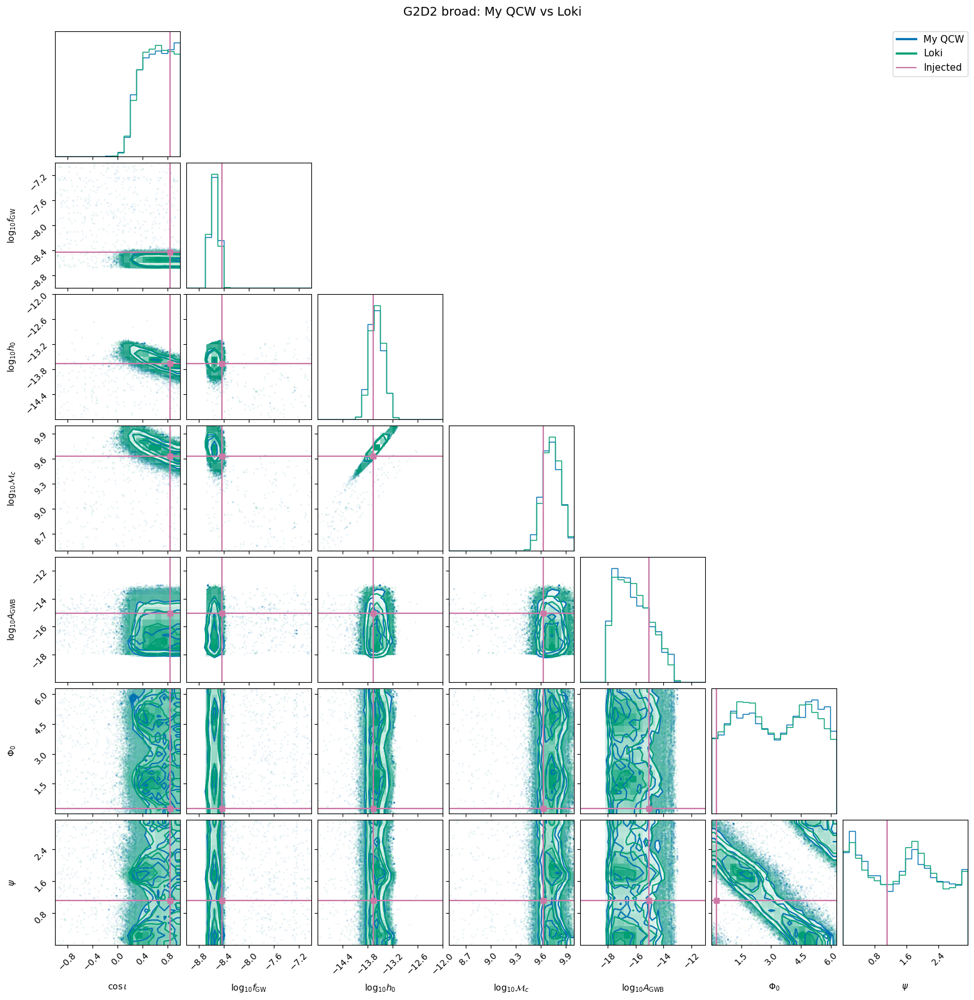

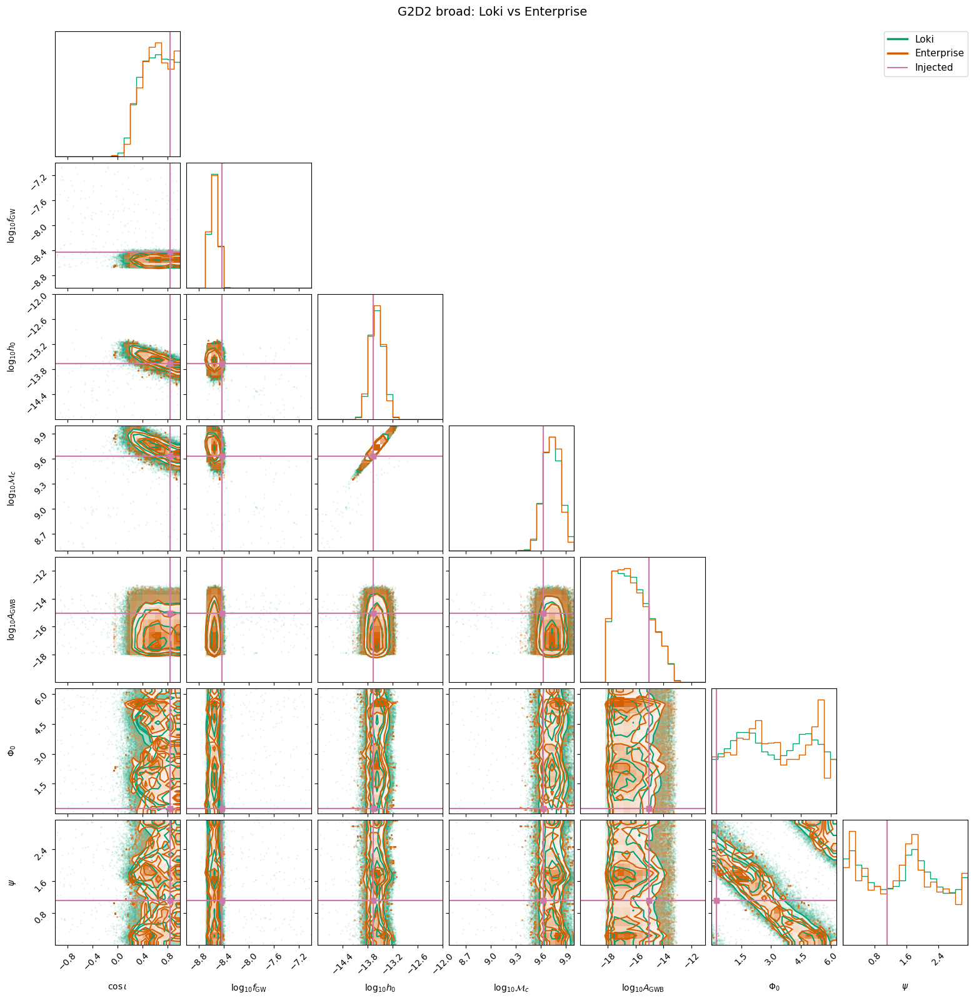

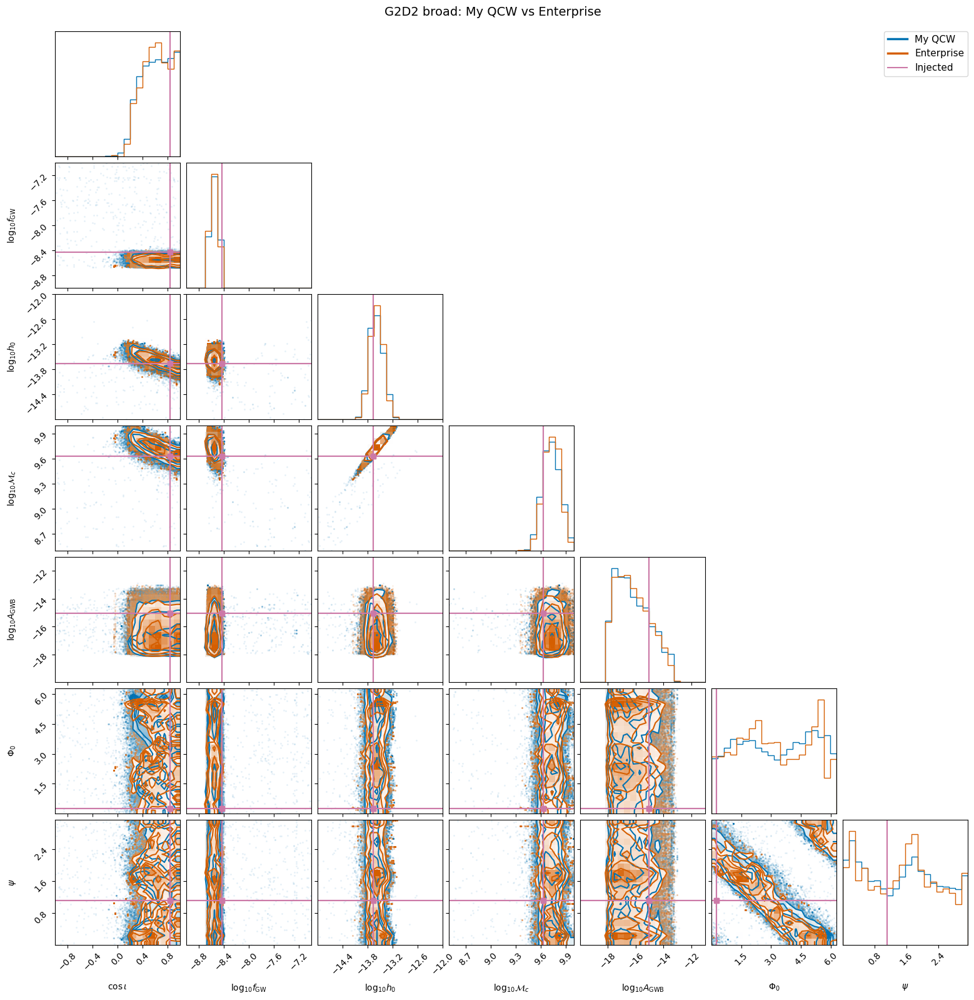

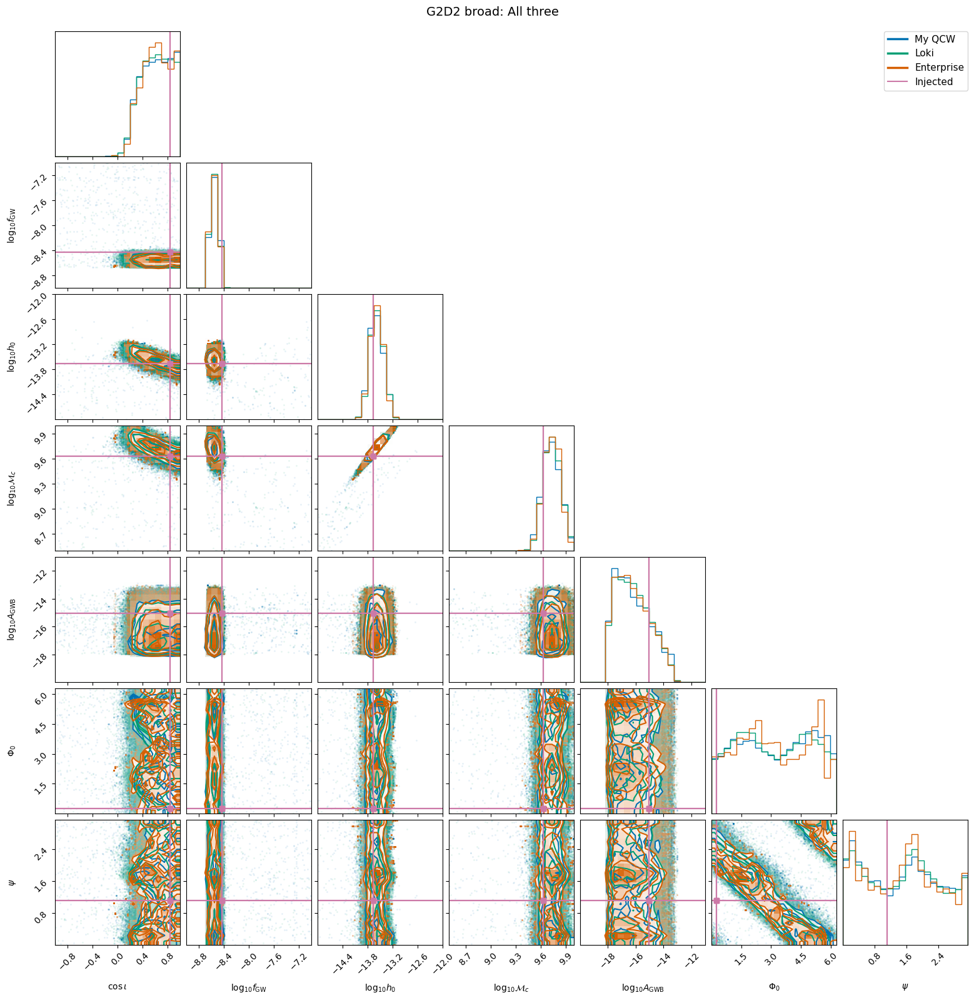

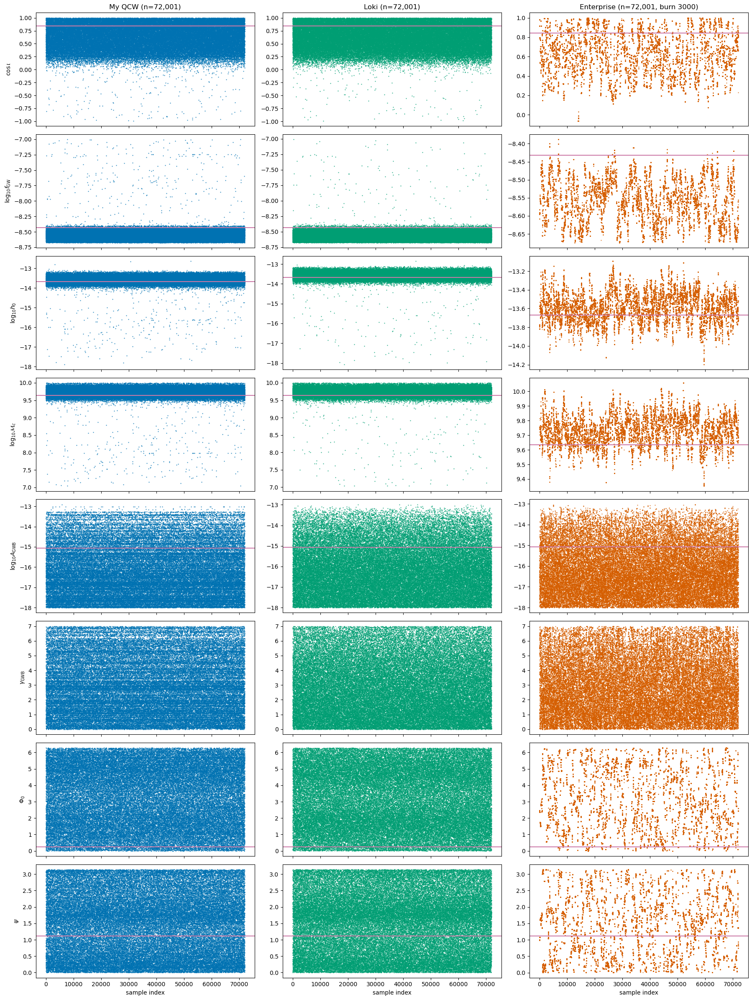


Parameter ranges

My QCW (n=72,001):
  cos_inc: [-0.993, 1.000]  median=0.626
  log10_fGW: [-8.674, -7.004]  median=-8.549
  log10_h0: [-17.878, -12.636]  median=-13.598
  log10_Mc: [7.043, 9.999]  median=9.726
  log10_A_GWB: [-17.999, -12.909]  median=-16.369
  gamma_GWB: [0.001, 6.999]  median=2.829
  phase0: [0.000, 6.283]  median=3.265
  psi: [0.000, 3.141]  median=1.535

Loki (n=72,001):
  cos_inc: [-0.990, 1.000]  median=0.620
  log10_fGW: [-8.674, -7.013]  median=-8.554
  log10_h0: [-18.063, -12.856]  median=-13.585
  log10_Mc: [7.035, 10.000]  median=9.733
  log10_A_GWB: [-18.000, -12.986]  median=-16.272
  gamma_GWB: [0.000, 7.000]  median=2.637
  phase0: [0.000, 6.283]  median=3.079
  psi: [0.000, 3.142]  median=1.580

Ent (n=72,001):
  cos_inc: [-0.064, 1.000]  median=0.631
  log10_fGW: [-8.674, -8.388]  median=-8.555
  log10_h0: [-14.195, -13.093]  median=-13.588
  log10_Mc: [9.353, 10.058]  median=9.735
  log10_A_GWB: [-18.000, -13.034]  median=-16.332
  gamma_GWB: [0.000

In [1]:
%matplotlib inline
import numpy as np
import h5py
import matplotlib.pyplot as plt
import corner

np.random.seed(42)

QCW_FILE = "/scratch/na00078/projects/IPTA_MDC2/h5_files/G2D2_broad_detect_tref_09_Jun_2026_dLmasked_75.400Mpc.h5"
LOKI_FILE = "/scratch/na00078/projects/IPTA_MDC2/h5_files/G2D2_broad_detect_loki_100M_lastTOA_02_Jun_2026.h5"
ENT_FILE = "/scratch/na00078/projects/IPTA_MDC2/h5_files/G2D2_varyfgw_core_new.h5"

ENT_BURN = 3000

# constants
megaparsec = 3.086e+22
speed_of_light = 299792458.0
T_sun = 1.327124400e20 / speed_of_light**3
D_MPC_FIXED = 75.400

def derive_log10_h0(log10_mc, log10_fgw, log10_dL_Mpc):
    return (np.log10(2.0)
            + (5.0/3.0) * (log10_mc + np.log10(T_sun))
            + (2.0/3.0) * (np.log10(np.pi) + log10_fgw)
            - (log10_dL_Mpc + np.log10(megaparsec) - np.log10(speed_of_light)))

# load
print("Loading...")
with h5py.File(QCW_FILE, "r") as f:
    qc = f["samples_masked"][...]
    qc_pn = [p.decode() if isinstance(p, bytes) else p for p in f["par_names"][:]]
with h5py.File(LOKI_FILE, "r") as f:
    lk = f["samples_cold"][0, :, :]
    lk_pn = [p.decode() if isinstance(p, bytes) else p for p in f["par_names"][:]]
with h5py.File(ENT_FILE, "r") as f:
    en_all = f["chain"][...]
    en_pn = [p.decode() if isinstance(p, bytes) else p for p in f["params"][:]]

# Enterprise: apply burn-in
en = en_all[ENT_BURN:, :]

# subsample QCW and Loki to match Enterprise post burn-in
N_TARGET = len(en)
qc_idx = np.random.choice(len(qc), min(N_TARGET, len(qc)), replace=False)
qc_sub = qc[qc_idx]
lk_idx = np.random.choice(len(lk), N_TARGET, replace=False)
lk_sub = lk[lk_idx]

print(f"All pipelines subsampled to match Enterprise (N = {N_TARGET})")
print(f"My QCW: {len(qc_sub):,}, Loki: {len(lk_sub):,}, Enterprise: {len(en):,}")

# extract
qcw_cosi = qc_sub[:, qc_pn.index("0_cos_inc")]
qcw_fgw  = qc_sub[:, qc_pn.index("0_log10_fgw")]
qcw_h    = qc_sub[:, qc_pn.index("0_log10_h")]
qcw_mc   = qc_sub[:, qc_pn.index("0_log10_mc")]
qcw_amp  = qc_sub[:, qc_pn.index("gwb_log10_A")]
qcw_gam  = qc_sub[:, qc_pn.index("gwb_gamma")]
qcw_phi  = qc_sub[:, qc_pn.index("0_phase0")]
qcw_psi  = qc_sub[:, qc_pn.index("0_psi")]

loki_cosi = lk_sub[:, lk_pn.index("0_cos_inc")]
loki_fgw  = lk_sub[:, lk_pn.index("0_log10_fgw")]
loki_mc   = lk_sub[:, lk_pn.index("0_log10_mc")]
loki_dist = lk_sub[:, lk_pn.index("0_log10_dist")]
loki_h    = derive_log10_h0(loki_mc, loki_fgw, loki_dist)
loki_amp  = lk_sub[:, lk_pn.index("gwb_log10_A")]
loki_gam  = lk_sub[:, lk_pn.index("gwb_gamma")]
loki_phi  = lk_sub[:, lk_pn.index("0_phase0")]
loki_psi  = lk_sub[:, lk_pn.index("0_psi")]

ent_cosi = en[:, en_pn.index("cos_inc")]
ent_fgw  = en[:, en_pn.index("log10_fgw")]
ent_mc   = en[:, en_pn.index("log10_mc")]
ent_h    = derive_log10_h0(ent_mc, ent_fgw, np.full_like(ent_mc, np.log10(D_MPC_FIXED)))
ent_amp  = en[:, en_pn.index("crn_log10_A")]
ent_phi  = en[:, en_pn.index("phase0")]
ent_psi  = en[:, en_pn.index("psi")]
ent_gam  = en[:, en_pn.index("crn_gamma")] if "crn_gamma" in en_pn else None

# truth
t_cosi = 0.8412486994612669
t_fgw  = np.log10(3.7e-9)
t_h    = -13.668773493298787
t_mc   = np.log10(4.3e9)
t_amp  = np.log10(0.85e-15)
t_phi  = 0.24434609527920614
t_psi  = 1.1187560505283651

CB, CG, CO, CT = "#0072B2", "#009E73", "#D55E00", "#CC79A7"

# corner setup (drop gamma since Ent doesn't have it)
labels_c = [r"$\cos\iota$", r"$\log_{10} f_{\rm GW}$", r"$\log_{10} h_0$",
            r"$\log_{10}\mathcal{M}_c$", r"$\log_{10} A_{\rm GWB}$",
            r"$\Phi_0$", r"$\psi$"]
ranges_c = [(-1, 1), (-9, -7), (-15, -12), (8.5, 10.0), (-20, -11),
            (0, 2*np.pi), (0, np.pi)]
truths_c = [t_cosi, t_fgw, t_h, t_mc, t_amp, t_phi, t_psi]

qcw_c  = np.column_stack([qcw_cosi, qcw_fgw, qcw_h, qcw_mc, qcw_amp, qcw_phi, qcw_psi])
loki_c = np.column_stack([loki_cosi, loki_fgw, loki_h, loki_mc, loki_amp, loki_phi, loki_psi])
ent_c  = np.column_stack([ent_cosi, ent_fgw, ent_h, ent_mc, ent_amp, ent_phi, ent_psi])

def make_corner(data_list, color_list, label_list, title):
    fig = corner.corner(data_list[0], labels=labels_c, truths=truths_c,
                        truth_color=CT, range=ranges_c, color=color_list[0])
    for d, c in zip(data_list[1:], color_list[1:]):
        corner.corner(d, fig=fig, labels=labels_c, truths=truths_c,
                      truth_color=CT, range=ranges_c, color=c)
    handles = [plt.Line2D([0],[0], color=c, lw=2.5, label=l)
               for c, l in zip(color_list, label_list)]
    handles.append(plt.Line2D([0],[0], color=CT, lw=1.5, label="Injected"))
    fig.legend(handles=handles, loc="upper right", fontsize=11,
               bbox_to_anchor=(0.98, 0.98))
    fig.suptitle(title, fontsize=14, y=1.0)
    return fig

# corner plots
make_corner([qcw_c, loki_c], [CB, CG],
            ["My QCW", "Loki"], "G2D2 broad: My QCW vs Loki")
plt.show()

make_corner([loki_c, ent_c], [CG, CO],
            ["Loki", "Enterprise"], "G2D2 broad: Loki vs Enterprise")
plt.show()

make_corner([qcw_c, ent_c], [CB, CO],
            ["My QCW", "Enterprise"], "G2D2 broad: My QCW vs Enterprise")
plt.show()

make_corner([qcw_c, loki_c, ent_c], [CB, CG, CO],
            ["My QCW", "Loki", "Enterprise"], "G2D2 broad: All three")
plt.show()

# trace plots
trace_rows = [
    (r"$\cos\iota$",              t_cosi, [(qcw_cosi, CB), (loki_cosi, CG), (ent_cosi, CO)]),
    (r"$\log_{10}f_{\rm GW}$",    t_fgw,  [(qcw_fgw, CB),  (loki_fgw, CG),  (ent_fgw, CO)]),
    (r"$\log_{10}h_0$",           t_h,    [(qcw_h, CB),    (loki_h, CG),    (ent_h, CO)]),
    (r"$\log_{10}\mathcal{M}_c$", t_mc,   [(qcw_mc, CB),   (loki_mc, CG),   (ent_mc, CO)]),
    (r"$\log_{10}A_{\rm GWB}$",   t_amp,  [(qcw_amp, CB),  (loki_amp, CG),  (ent_amp, CO)]),
    (r"$\gamma_{\rm GWB}$",       None,   [(qcw_gam, CB),  (loki_gam, CG),  (ent_gam, CO)]),
    (r"$\Phi_0$",                 t_phi,  [(qcw_phi, CB),  (loki_phi, CG),  (ent_phi, CO)]),
    (r"$\psi$",                   t_psi,  [(qcw_psi, CB),  (loki_psi, CG),  (ent_psi, CO)]),
]

titles = [f"My QCW (n={len(qcw_cosi):,})",
          f"Loki (n={len(loki_cosi):,})",
          f"Enterprise (n={len(ent_cosi):,}, burn {ENT_BURN})"]

fig, axes = plt.subplots(len(trace_rows), 3, figsize=(18, 24), sharex="col")
for row_i, (ylabel, truth_val, data) in enumerate(trace_rows):
    for col_i, (arr, color) in enumerate(data):
        if arr is None:
            axes[row_i, col_i].text(0.5, 0.5, "fixed",
                                    transform=axes[row_i, col_i].transAxes,
                                    ha="center", va="center", color="gray")
        else:
            axes[row_i, col_i].plot(arr, marker=".", linestyle="None",
                                    markersize=1, color=color, rasterized=True)
            if truth_val is not None:
                axes[row_i, col_i].axhline(truth_val, color=CT, lw=1.5)
    axes[row_i, 0].set_ylabel(ylabel)

for col_i, t in enumerate(titles):
    axes[0, col_i].set_title(t)
for col_i in range(3):
    axes[-1, col_i].set_xlabel("sample index")

plt.tight_layout()
plt.show()

# parameter ranges
print("\n" + "=" * 70)
print("Parameter ranges")
print("=" * 70)
all_labels = ["cos_inc", "log10_fGW", "log10_h0", "log10_Mc",
              "log10_A_GWB", "gamma_GWB", "phase0", "psi"]

for name, arrs in [
    ("My QCW", (qcw_cosi, qcw_fgw, qcw_h, qcw_mc, qcw_amp, qcw_gam, qcw_phi, qcw_psi)),
    ("Loki",   (loki_cosi, loki_fgw, loki_h, loki_mc, loki_amp, loki_gam, loki_phi, loki_psi)),
    ("Ent",    (ent_cosi, ent_fgw, ent_h, ent_mc, ent_amp, ent_gam, ent_phi, ent_psi)),
]:
    print(f"\n{name} (n={len(arrs[0]):,}):")
    for lab, a in zip(all_labels, arrs):
        if a is None:
            print(f"  {lab}: fixed")
        else:
            print(f"  {lab}: [{a.min():.3f}, {a.max():.3f}]  median={np.median(a):.3f}")

Loading...
Corner: subsampled to Enterprise N = 72001
  My QCW: 72,001, Loki: 72,001, Enterprise: 72,001
Trace: full chains (no thinning, no burn-in for QCW and Loki)
  My QCW: 204,278, Loki: 100,000,000, Enterprise: 72,001


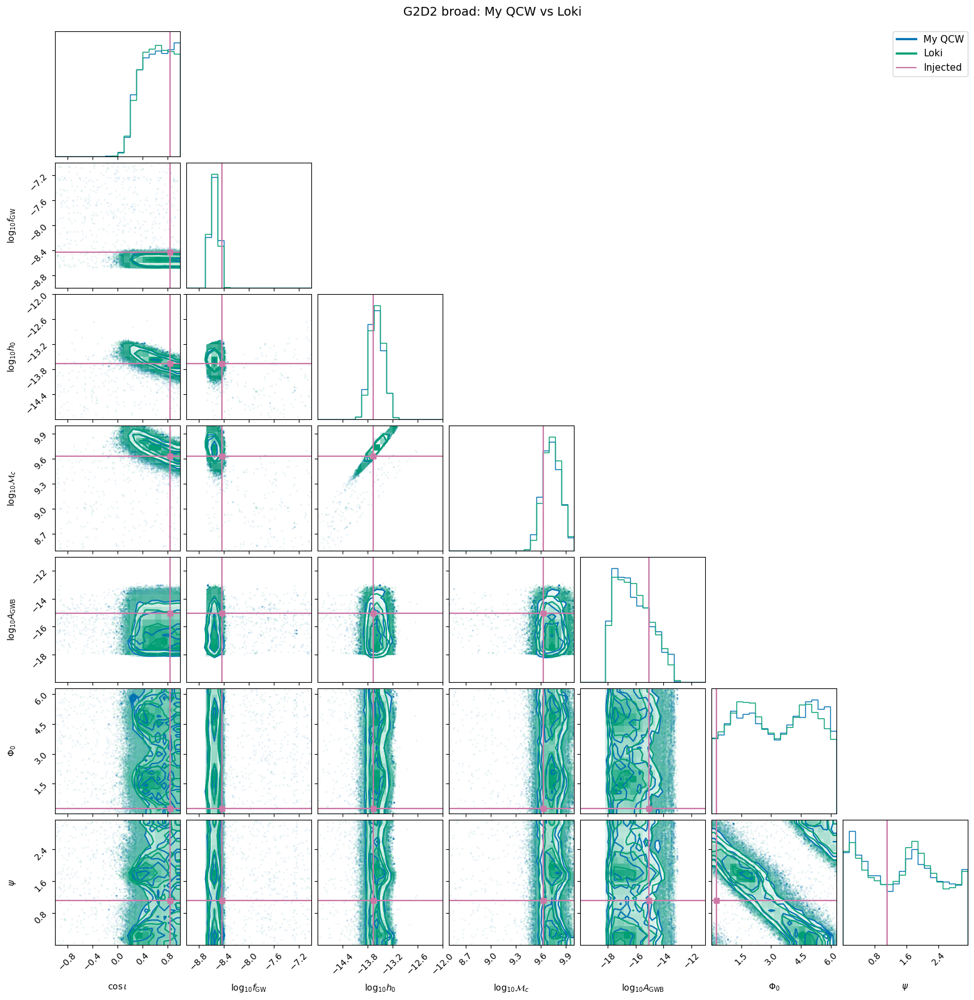

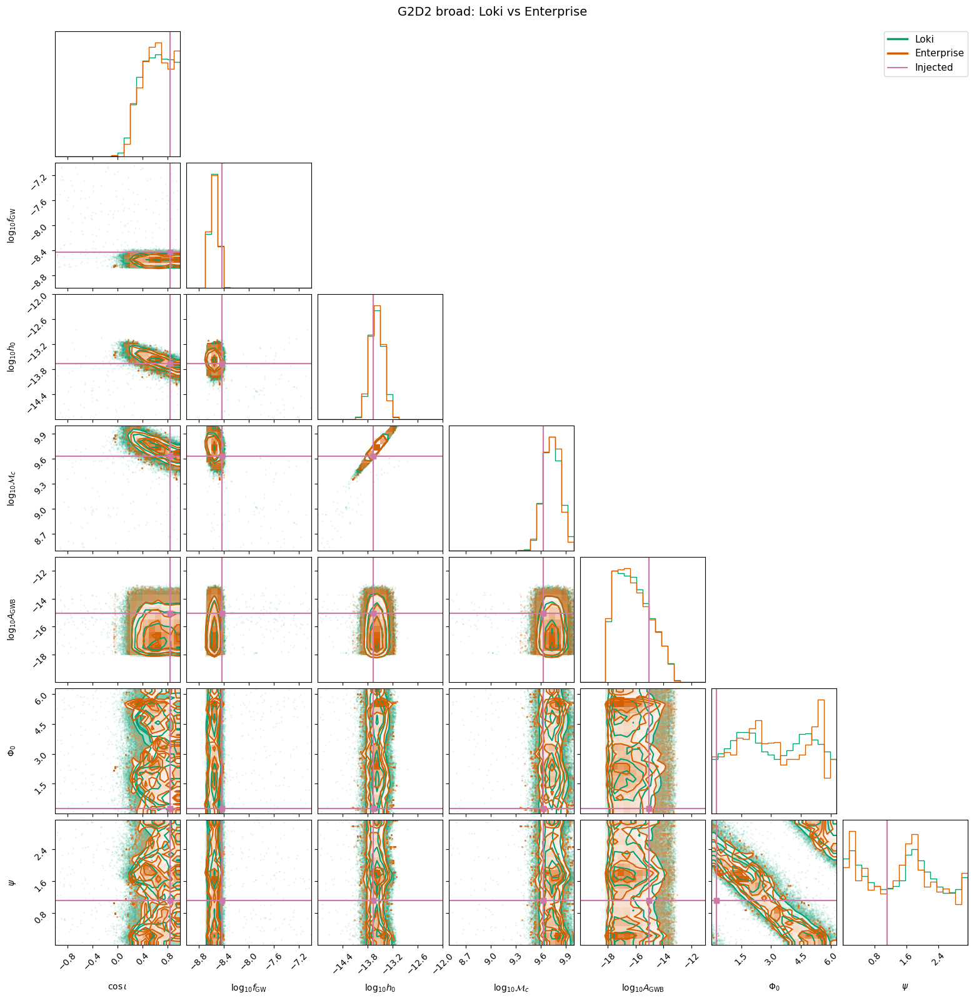

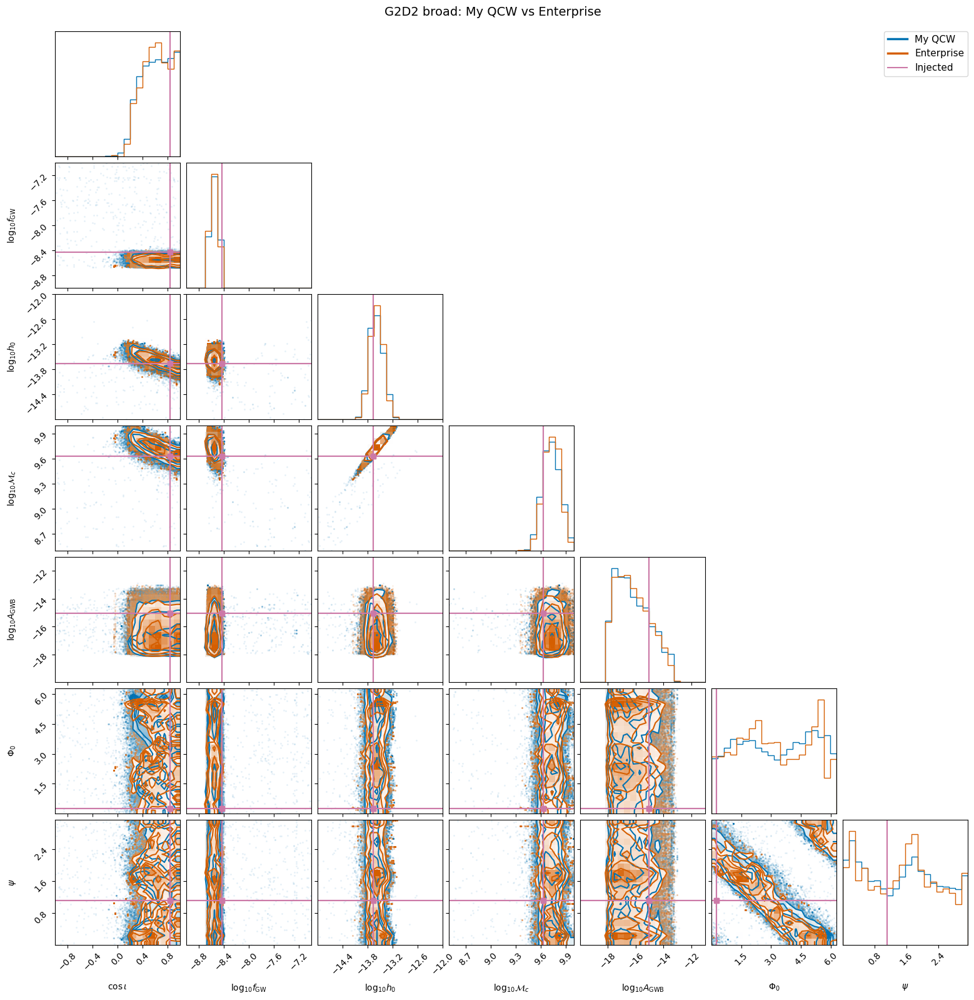

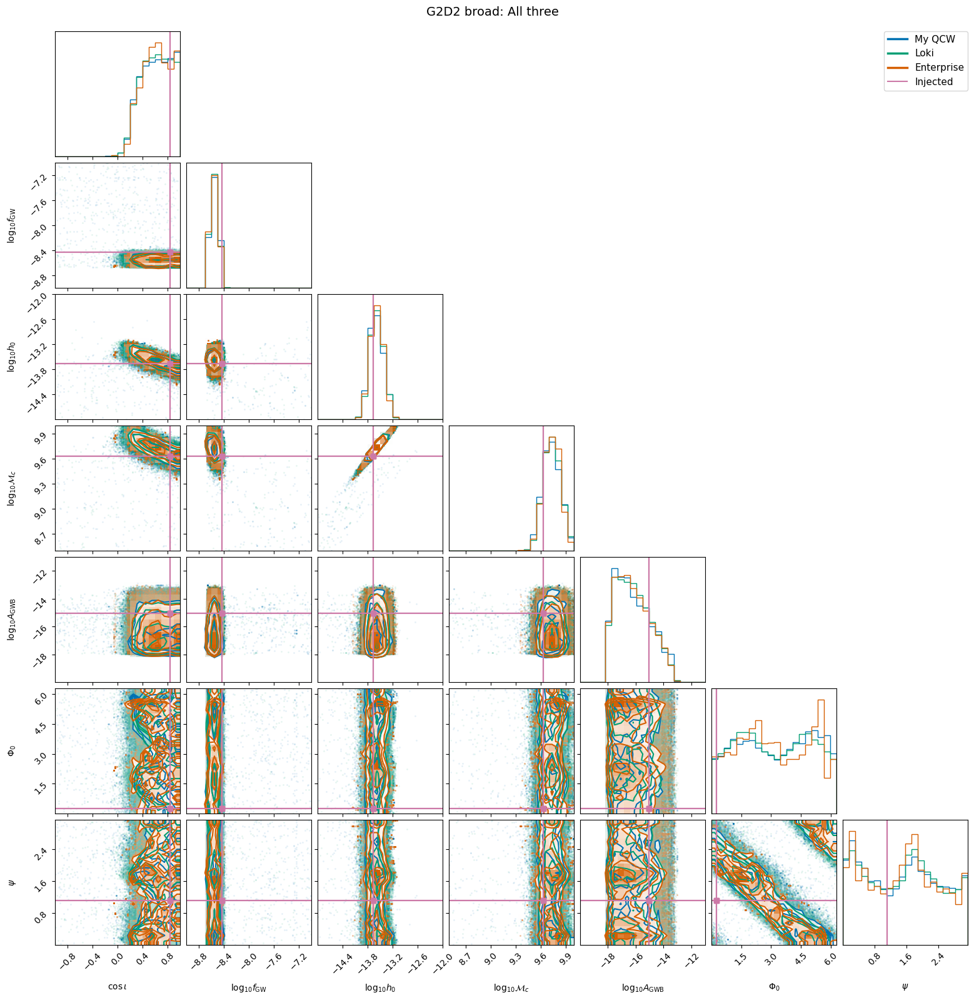

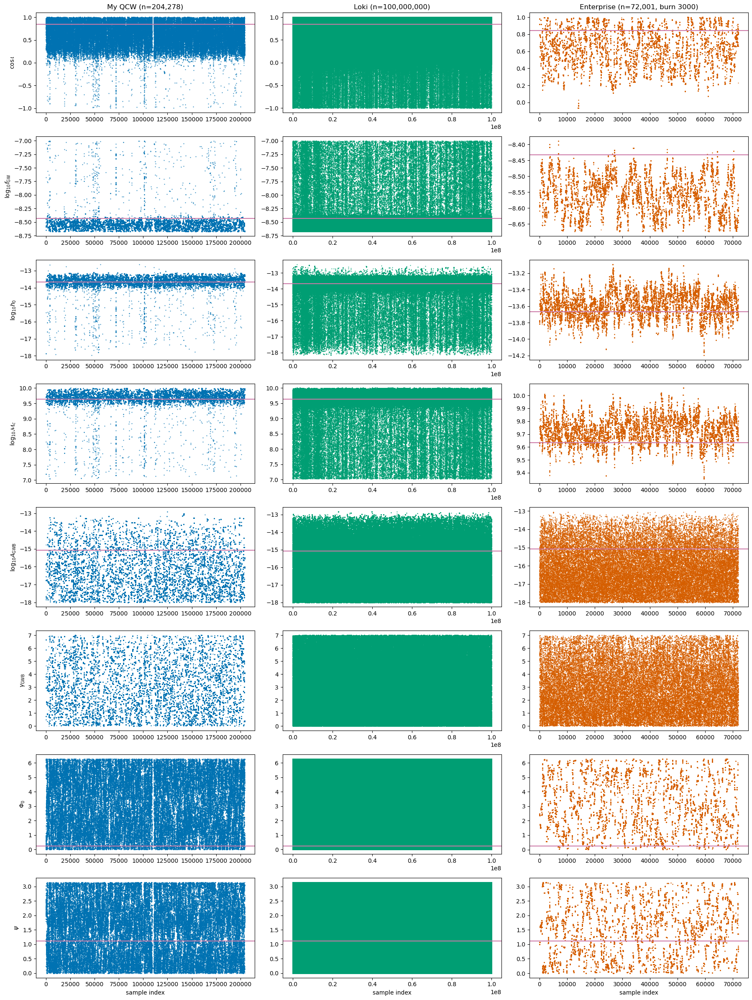


Parameter ranges (full chains)

My QCW (n=204,278):
  cos_inc: [-0.993, 1.000]  median=0.627
  log10_fGW: [-8.674, -7.003]  median=-8.549
  log10_h0: [-17.965, -12.632]  median=-13.598
  log10_Mc: [7.043, 9.999]  median=9.726
  log10_A_GWB: [-17.999, -12.909]  median=-16.364
  gamma_GWB: [0.001, 6.999]  median=2.827
  phase0: [0.000, 6.283]  median=3.279
  psi: [0.000, 3.142]  median=1.527

Loki (n=100,000,000):
  cos_inc: [-1.000, 1.000]  median=0.619
  log10_fGW: [-8.674, -7.000]  median=-8.554
  log10_h0: [-18.162, -12.469]  median=-13.584
  log10_Mc: [7.030, 10.000]  median=9.734
  log10_A_GWB: [-18.000, -12.836]  median=-16.285
  gamma_GWB: [0.000, 7.000]  median=2.628
  phase0: [0.000, 6.283]  median=3.109
  psi: [0.000, 3.142]  median=1.567

Ent (n=72,001):
  cos_inc: [-0.064, 1.000]  median=0.631
  log10_fGW: [-8.674, -8.388]  median=-8.555
  log10_h0: [-14.195, -13.093]  median=-13.588
  log10_Mc: [9.353, 10.058]  median=9.735
  log10_A_GWB: [-18.000, -13.034]  median=-16.332

In [2]:
%matplotlib inline
import numpy as np
import h5py
import matplotlib.pyplot as plt
import corner

np.random.seed(42)

QCW_FILE = "/scratch/na00078/projects/IPTA_MDC2/h5_files/G2D2_broad_detect_tref_09_Jun_2026_dLmasked_75.400Mpc.h5"
LOKI_FILE = "/scratch/na00078/projects/IPTA_MDC2/h5_files/G2D2_broad_detect_loki_100M_lastTOA_02_Jun_2026.h5"
ENT_FILE = "/scratch/na00078/projects/IPTA_MDC2/h5_files/G2D2_varyfgw_core_new.h5"

ENT_BURN = 3000

# constants
megaparsec = 3.086e+22
speed_of_light = 299792458.0
T_sun = 1.327124400e20 / speed_of_light**3
D_MPC_FIXED = 75.400

def derive_log10_h0(log10_mc, log10_fgw, log10_dL_Mpc):
    return (np.log10(2.0)
            + (5.0/3.0) * (log10_mc + np.log10(T_sun))
            + (2.0/3.0) * (np.log10(np.pi) + log10_fgw)
            - (log10_dL_Mpc + np.log10(megaparsec) - np.log10(speed_of_light)))

# load
print("Loading...")
with h5py.File(QCW_FILE, "r") as f:
    qc = f["samples_masked"][...]
    qc_pn = [p.decode() if isinstance(p, bytes) else p for p in f["par_names"][:]]
with h5py.File(LOKI_FILE, "r") as f:
    lk = f["samples_cold"][0, :, :]
    lk_pn = [p.decode() if isinstance(p, bytes) else p for p in f["par_names"][:]]
with h5py.File(ENT_FILE, "r") as f:
    en_all = f["chain"][...]
    en_pn = [p.decode() if isinstance(p, bytes) else p for p in f["params"][:]]

# Enterprise: apply burn-in
en = en_all[ENT_BURN:, :]

# subsample QCW and Loki to match Enterprise post burn-in (for CORNER plots)
N_TARGET = len(en)
qc_idx = np.random.choice(len(qc), min(N_TARGET, len(qc)), replace=False)
qc_sub = qc[qc_idx]
lk_idx = np.random.choice(len(lk), N_TARGET, replace=False)
lk_sub = lk[lk_idx]

print(f"Corner: subsampled to Enterprise N = {N_TARGET}")
print(f"  My QCW: {len(qc_sub):,}, Loki: {len(lk_sub):,}, Enterprise: {len(en):,}")
print(f"Trace: full chains (no thinning, no burn-in for QCW and Loki)")
print(f"  My QCW: {len(qc):,}, Loki: {len(lk):,}, Enterprise: {len(en):,}")

# ============================================================
# CORNER plot data (subsampled)
# ============================================================
qcw_cosi = qc_sub[:, qc_pn.index("0_cos_inc")]
qcw_fgw  = qc_sub[:, qc_pn.index("0_log10_fgw")]
qcw_h    = qc_sub[:, qc_pn.index("0_log10_h")]
qcw_mc   = qc_sub[:, qc_pn.index("0_log10_mc")]
qcw_amp  = qc_sub[:, qc_pn.index("gwb_log10_A")]
qcw_phi  = qc_sub[:, qc_pn.index("0_phase0")]
qcw_psi  = qc_sub[:, qc_pn.index("0_psi")]

loki_cosi = lk_sub[:, lk_pn.index("0_cos_inc")]
loki_fgw  = lk_sub[:, lk_pn.index("0_log10_fgw")]
loki_mc   = lk_sub[:, lk_pn.index("0_log10_mc")]
loki_dist = lk_sub[:, lk_pn.index("0_log10_dist")]
loki_h    = derive_log10_h0(loki_mc, loki_fgw, loki_dist)
loki_amp  = lk_sub[:, lk_pn.index("gwb_log10_A")]
loki_phi  = lk_sub[:, lk_pn.index("0_phase0")]
loki_psi  = lk_sub[:, lk_pn.index("0_psi")]

ent_cosi = en[:, en_pn.index("cos_inc")]
ent_fgw  = en[:, en_pn.index("log10_fgw")]
ent_mc   = en[:, en_pn.index("log10_mc")]
ent_h    = derive_log10_h0(ent_mc, ent_fgw, np.full_like(ent_mc, np.log10(D_MPC_FIXED)))
ent_amp  = en[:, en_pn.index("crn_log10_A")]
ent_phi  = en[:, en_pn.index("phase0")]
ent_psi  = en[:, en_pn.index("psi")]

# truth (from MDC2 JSON)
t_cosi = 0.8412486994612669
t_fgw  = np.log10(3.7e-9)
t_h    = -13.668773493298787
t_mc   = np.log10(4.3e9)
t_amp  = -15.070581074285707
t_phi  = 0.24434609527920614
t_psi  = 1.1187560505283651

CB, CG, CO, CT = "#0072B2", "#009E73", "#D55E00", "#CC79A7"

# corner setup
labels_c = [r"$\cos\iota$", r"$\log_{10} f_{\rm GW}$", r"$\log_{10} h_0$",
            r"$\log_{10}\mathcal{M}_c$", r"$\log_{10} A_{\rm GWB}$",
            r"$\Phi_0$", r"$\psi$"]
ranges_c = [(-1, 1), (-9, -7), (-15, -12), (8.5, 10.0), (-20, -11),
            (0, 2*np.pi), (0, np.pi)]
truths_c = [t_cosi, t_fgw, t_h, t_mc, t_amp, t_phi, t_psi]

qcw_c  = np.column_stack([qcw_cosi, qcw_fgw, qcw_h, qcw_mc, qcw_amp, qcw_phi, qcw_psi])
loki_c = np.column_stack([loki_cosi, loki_fgw, loki_h, loki_mc, loki_amp, loki_phi, loki_psi])
ent_c  = np.column_stack([ent_cosi, ent_fgw, ent_h, ent_mc, ent_amp, ent_phi, ent_psi])

def make_corner(data_list, color_list, label_list, title):
    fig = corner.corner(data_list[0], labels=labels_c, truths=truths_c,
                        truth_color=CT, range=ranges_c, color=color_list[0])
    for d, c in zip(data_list[1:], color_list[1:]):
        corner.corner(d, fig=fig, labels=labels_c, truths=truths_c,
                      truth_color=CT, range=ranges_c, color=c)
    handles = [plt.Line2D([0],[0], color=c, lw=2.5, label=l)
               for c, l in zip(color_list, label_list)]
    handles.append(plt.Line2D([0],[0], color=CT, lw=1.5, label="Injected"))
    fig.legend(handles=handles, loc="upper right", fontsize=11,
               bbox_to_anchor=(0.98, 0.98))
    fig.suptitle(title, fontsize=14, y=1.0)
    return fig

# corner plots
make_corner([qcw_c, loki_c], [CB, CG],
            ["My QCW", "Loki"], "G2D2 broad: My QCW vs Loki")
plt.show()

make_corner([loki_c, ent_c], [CG, CO],
            ["Loki", "Enterprise"], "G2D2 broad: Loki vs Enterprise")
plt.show()

make_corner([qcw_c, ent_c], [CB, CO],
            ["My QCW", "Enterprise"], "G2D2 broad: My QCW vs Enterprise")
plt.show()

make_corner([qcw_c, loki_c, ent_c], [CB, CG, CO],
            ["My QCW", "Loki", "Enterprise"], "G2D2 broad: All three")
plt.show()

# ============================================================
# TRACE plot data (full chains for QCW and Loki, no thinning)
# Enterprise keeps burn-in cut as Bjorn specified
# ============================================================
# QCW full chain in order
qcw_t_cosi = qc[:, qc_pn.index("0_cos_inc")]
qcw_t_fgw  = qc[:, qc_pn.index("0_log10_fgw")]
qcw_t_h    = qc[:, qc_pn.index("0_log10_h")]
qcw_t_mc   = qc[:, qc_pn.index("0_log10_mc")]
qcw_t_amp  = qc[:, qc_pn.index("gwb_log10_A")]
qcw_t_gam  = qc[:, qc_pn.index("gwb_gamma")]
qcw_t_phi  = qc[:, qc_pn.index("0_phase0")]
qcw_t_psi  = qc[:, qc_pn.index("0_psi")]

# Loki full chain in order
loki_t_cosi = lk[:, lk_pn.index("0_cos_inc")]
loki_t_fgw  = lk[:, lk_pn.index("0_log10_fgw")]
loki_t_mc   = lk[:, lk_pn.index("0_log10_mc")]
loki_t_dist = lk[:, lk_pn.index("0_log10_dist")]
loki_t_h    = derive_log10_h0(loki_t_mc, loki_t_fgw, loki_t_dist)
loki_t_amp  = lk[:, lk_pn.index("gwb_log10_A")]
loki_t_gam  = lk[:, lk_pn.index("gwb_gamma")]
loki_t_phi  = lk[:, lk_pn.index("0_phase0")]
loki_t_psi  = lk[:, lk_pn.index("0_psi")]

# Enterprise full post burn-in in order
ent_t_cosi = en[:, en_pn.index("cos_inc")]
ent_t_fgw  = en[:, en_pn.index("log10_fgw")]
ent_t_mc   = en[:, en_pn.index("log10_mc")]
ent_t_h    = derive_log10_h0(ent_t_mc, ent_t_fgw, np.full_like(ent_t_mc, np.log10(D_MPC_FIXED)))
ent_t_amp  = en[:, en_pn.index("crn_log10_A")]
ent_t_phi  = en[:, en_pn.index("phase0")]
ent_t_psi  = en[:, en_pn.index("psi")]
ent_t_gam  = en[:, en_pn.index("crn_gamma")] if "crn_gamma" in en_pn else None

trace_rows = [
    (r"$\cos\iota$",              t_cosi, [(qcw_t_cosi, CB), (loki_t_cosi, CG), (ent_t_cosi, CO)]),
    (r"$\log_{10}f_{\rm GW}$",    t_fgw,  [(qcw_t_fgw, CB),  (loki_t_fgw, CG),  (ent_t_fgw, CO)]),
    (r"$\log_{10}h_0$",           t_h,    [(qcw_t_h, CB),    (loki_t_h, CG),    (ent_t_h, CO)]),
    (r"$\log_{10}\mathcal{M}_c$", t_mc,   [(qcw_t_mc, CB),   (loki_t_mc, CG),   (ent_t_mc, CO)]),
    (r"$\log_{10}A_{\rm GWB}$",   t_amp,  [(qcw_t_amp, CB),  (loki_t_amp, CG),  (ent_t_amp, CO)]),
    (r"$\gamma_{\rm GWB}$",       None,   [(qcw_t_gam, CB),  (loki_t_gam, CG),  (ent_t_gam, CO)]),
    (r"$\Phi_0$",                 t_phi,  [(qcw_t_phi, CB),  (loki_t_phi, CG),  (ent_t_phi, CO)]),
    (r"$\psi$",                   t_psi,  [(qcw_t_psi, CB),  (loki_t_psi, CG),  (ent_t_psi, CO)]),
]

titles = [f"My QCW (n={len(qcw_t_cosi):,})",
          f"Loki (n={len(loki_t_cosi):,})",
          f"Enterprise (n={len(ent_t_cosi):,}, burn {ENT_BURN})"]

# each column has its own x-axis (different chain lengths), so no sharex
fig, axes = plt.subplots(len(trace_rows), 3, figsize=(18, 24))
for row_i, (ylabel, truth_val, data) in enumerate(trace_rows):
    for col_i, (arr, color) in enumerate(data):
        if arr is None:
            axes[row_i, col_i].text(0.5, 0.5, "fixed",
                                    transform=axes[row_i, col_i].transAxes,
                                    ha="center", va="center", color="gray")
        else:
            axes[row_i, col_i].plot(arr, marker=".", linestyle="None",
                                    markersize=1, color=color, rasterized=True)
            if truth_val is not None:
                axes[row_i, col_i].axhline(truth_val, color=CT, lw=1.5)
    axes[row_i, 0].set_ylabel(ylabel)

for col_i, t in enumerate(titles):
    axes[0, col_i].set_title(t)
for col_i in range(3):
    axes[-1, col_i].set_xlabel("sample index")

plt.tight_layout()
plt.show()

# parameter ranges (full chains)
print("\n" + "=" * 70)
print("Parameter ranges (full chains)")
print("=" * 70)
all_labels = ["cos_inc", "log10_fGW", "log10_h0", "log10_Mc",
              "log10_A_GWB", "gamma_GWB", "phase0", "psi"]

for name, arrs in [
    ("My QCW", (qcw_t_cosi, qcw_t_fgw, qcw_t_h, qcw_t_mc, qcw_t_amp, qcw_t_gam, qcw_t_phi, qcw_t_psi)),
    ("Loki",   (loki_t_cosi, loki_t_fgw, loki_t_h, loki_t_mc, loki_t_amp, loki_t_gam, loki_t_phi, loki_t_psi)),
    ("Ent",    (ent_t_cosi, ent_t_fgw, ent_t_h, ent_t_mc, ent_t_amp, ent_t_gam, ent_t_phi, ent_t_psi)),
]:
    print(f"\n{name} (n={len(arrs[0]):,}):")
    for lab, a in zip(all_labels, arrs):
        if a is None:
            print(f"  {lab}: fixed")
        else:
            print(f"  {lab}: [{a.min():.3f}, {a.max():.3f}]  median={np.median(a):.3f}")

In [3]:
print("\n" + "=" * 70)
print("Min / Max per parameter (full trace chains)")
print("=" * 70)

params = [
    ("cos_inc",     qcw_t_cosi, loki_t_cosi, ent_t_cosi),
    ("log10_fGW",   qcw_t_fgw,  loki_t_fgw,  ent_t_fgw),
    ("log10_h0",    qcw_t_h,    loki_t_h,    ent_t_h),
    ("log10_Mc",    qcw_t_mc,   loki_t_mc,   ent_t_mc),
    ("log10_A_GWB", qcw_t_amp,  loki_t_amp,  ent_t_amp),
    ("gamma_GWB",   qcw_t_gam,  loki_t_gam,  ent_t_gam),
    ("phase0",      qcw_t_phi,  loki_t_phi,  ent_t_phi),
    ("psi",         qcw_t_psi,  loki_t_psi,  ent_t_psi),
]

for name, q, l, e in params:
    print(f"\n{name}:")
    print(f"  QCW : {q.min():.4f}  {q.max():.4f}")
    print(f"  Loki: {l.min():.4f}  {l.max():.4f}")
    if e is None:
        print(f"  Ent : fixed (not sampled)")
    else:
        print(f"  Ent : {e.min():.4f}  {e.max():.4f}")


Min / Max per parameter (full trace chains)

cos_inc:
  QCW : -0.9928  1.0000
  Loki: -1.0000  1.0000
  Ent : -0.0640  0.9997

log10_fGW:
  QCW : -8.6741  -7.0032
  Loki: -8.6741  -7.0001
  Ent : -8.6740  -8.3884

log10_h0:
  QCW : -17.9649  -12.6321
  Loki: -18.1625  -12.4690
  Ent : -14.1953  -13.0933

log10_Mc:
  QCW : 7.0426  9.9993
  Loki: 7.0300  10.0000
  Ent : 9.3534  10.0577

log10_A_GWB:
  QCW : -17.9992  -12.9085
  Loki: -18.0000  -12.8361
  Ent : -18.0000  -13.0343

gamma_GWB:
  QCW : 0.0011  6.9991
  Loki: 0.0000  6.9999
  Ent : 0.0000  6.9992

phase0:
  QCW : 0.0001  6.2831
  Loki: 0.0000  6.2832
  Ent : 0.0009  6.2812

psi:
  QCW : 0.0001  3.1415
  Loki: 0.0000  3.1416
  Ent : 0.0023  3.1408


In [4]:
import numpy as np
for name, l, e in [("cos_inc", loki_t_cosi, ent_t_cosi),
                   ("log10_h0", loki_t_h, ent_t_h),
                   ("log10_Mc", loki_t_mc, ent_t_mc)]:
    lp = np.percentile(l, [5, 50, 95])
    ep = np.percentile(e, [5, 50, 95])
    print(f"{name}:")
    print(f"  Loki 5/50/95: {lp[0]:.3f} {lp[1]:.3f} {lp[2]:.3f}")
    print(f"  Ent  5/50/95: {ep[0]:.3f} {ep[1]:.3f} {ep[2]:.3f}")

cos_inc:
  Loki 5/50/95: 0.232 0.619 0.960
  Ent  5/50/95: 0.255 0.631 0.960
log10_h0:
  Loki 5/50/95: -13.838 -13.584 -13.307
  Ent  5/50/95: -13.840 -13.588 -13.331
log10_Mc:
  Loki 5/50/95: 9.570 9.734 9.909
  Ent  5/50/95: 9.570 9.735 9.901


In [2]:
# ===== SD BF via analytic induced prior on x = log10 h0 (Loki, Slack 17 Jun), BROAD =====
from itertools import combinations
from math import factorial

LOG10_MC_MIN, LOG10_MC_MAX = 7.0, 10.0
QCW_H_MIN, QCW_H_MAX = -18.0, -11.0
DL0, ETA = 75.400, 0.01
LOG10_F_MAX = -7.0
BIN_COUNTS = (20, 30, 40, 50, 75, 100)

XCONST = (np.log10(2.0) + (5.0/3.0)*np.log10(T_sun) + (2.0/3.0)*np.log10(np.pi)
          - (np.log10(megaparsec) - np.log10(speed_of_light)))

def sum_uniform_pdf(y, widths):
    K = len(widths); y = np.asarray(y, dtype=float); out = np.zeros_like(y)
    for r in range(K + 1):
        for S in combinations(range(K), r):
            sh = sum(widths[k] for k in S)
            out += ((-1)**r) * np.where(y > sh, np.maximum(y - sh, 0.0)**(K - 1), 0.0)
    out = out / (factorial(K - 1) * np.prod(widths))
    return np.where((y >= 0.0) & (y <= sum(widths)), out, 0.0)

def induced_prior(terms, const):
    widths = [abs(s)*(hi - lo) for s, lo, hi in terms if abs(s)*(hi - lo) > 0]
    x_lo = const + sum(min(s*lo, s*hi) for s, lo, hi in terms)
    x_hi = x_lo + sum(widths)
    return (lambda x: sum_uniform_pdf(np.asarray(x) - x_lo, widths)), x_lo, x_hi

def sd_bf10(x, x_lo, x_hi, weights=None, label=""):
    if weights is None: weights = np.ones_like(x)
    pd = 1.0/(x_hi - x_lo); ws = weights.sum()
    ne = ws**2/(weights**2).sum()
    print(f"--- {label}")
    print(f"    support [{x_lo:.3f}, {x_hi:.3f}] width {x_hi-x_lo:.3f} N={len(x):,} Neff={ne:,.0f}")
    fin = []
    for nb in BIN_COUNTS:
        edges = np.linspace(x_lo, x_hi, nb + 1)
        wh, _ = np.histogram(x, bins=edges, weights=weights)
        rh, _ = np.histogram(x, bins=edges)
        d0 = wh[0]/(ws*(edges[1]-edges[0]))
        bf = pd/d0 if (rh[0] > 0 and d0 > 0) else np.inf
        print(f"    bins={nb:4d} raw n(lowest)={rh[0]:9d} BF10={bf:.6g}")
        if np.isfinite(bf): fin.append(bf)
    if fin:
        fin = np.array(fin)
        print(f"    BF10 = {fin.mean():.4g} +/- {fin.std():.2g} over finite variants")
    else:
        print("    BF10 = inf for all widths (no samples at null; quote lower limit)")
    nb = BIN_COUNTS[-1]; edges = np.linspace(x_lo, x_hi, nb+1)
    d1 = 1.0/(len(x)*(edges[1]-edges[0]))
    print(f"    (1-sample density floor at bins={nb}: BF10 limit ~ {pd/d1:.4g})")
    print()

qcw_x = qc[:, qc_pn.index("0_log10_h")]
lk_mc_f  = lk[:, lk_pn.index("0_log10_mc")]
lk_dl_f  = lk[:, lk_pn.index("0_log10_dist")]
lk_fgw_f = lk[:, lk_pn.index("0_log10_fgw")]
en_mc_f  = en[:, en_pn.index("log10_mc")]
en_fgw_f = en[:, en_pn.index("log10_fgw")]
loki_x = derive_log10_h0(lk_mc_f, lk_fgw_f, lk_dl_f)
ent_x  = derive_log10_h0(en_mc_f, en_fgw_f, np.full_like(en_mc_f, np.log10(D_MPC_FIXED)))

print(f"fgw ranges | QCW sub n/a full: [{qc[:, qc_pn.index('0_log10_fgw')].min():.4f}, {qc[:, qc_pn.index('0_log10_fgw')].max():.4f}]")
print(f"           | Loki [{lk_fgw_f.min():.4f}, {lk_fgw_f.max():.4f}]  Ent [{en_fgw_f.min():.4f}, {en_fgw_f.max():.4f}]")
LOG10_F_MIN = float(np.floor(min(lk_fgw_f.min(), en_fgw_f.min())*100)/100)
print(f"using LOG10_F_MIN = {LOG10_F_MIN}  <-- verify equals log10(1/Tspan) from run config")
print(f"loki dL range: [{lk_dl_f.min():.5f}, {lk_dl_f.max():.5f}] vs prior [{np.log10(DL0*0.99):.5f}, {np.log10(DL0*1.01):.5f}]")

mc_term = (5.0/3.0, LOG10_MC_MIN, LOG10_MC_MAX)
dl_term = (-1.0, np.log10(DL0*(1.0-ETA)), np.log10(DL0*(1.0+ETA)))
f_term  = (2.0/3.0, LOG10_F_MIN, LOG10_F_MAX)
e_pdf, e_lo, e_hi = induced_prior([mc_term, f_term], XCONST - np.log10(DL0))
l_pdf, l_lo, l_hi = induced_prior([mc_term, f_term, dl_term], XCONST)

print(f"x ranges | QCW [{qcw_x.min():.3f}, {qcw_x.max():.3f}] prior [{QCW_H_MIN}, {QCW_H_MAX}]")
print(f"         | Loki [{loki_x.min():.3f}, {loki_x.max():.3f}] analytic [{l_lo:.3f}, {l_hi:.3f}]")
print(f"         | Ent  [{ent_x.min():.3f}, {ent_x.max():.3f}] analytic [{e_lo:.3f}, {e_hi:.3f}]")
print()

w_l = 1.0/np.clip(l_pdf(loki_x), 1e-300, None)
w_e = 1.0/np.clip(e_pdf(ent_x), 1e-300, None)

sd_bf10(qcw_x, QCW_H_MIN, QCW_H_MAX, label="QCW broad: sampled log10 h0, flat prior, dL-masked")
sd_bf10(ent_x, e_lo, e_hi, weights=w_e, label="Enterprise broad: derived log10 h0, reweighted")
sd_bf10(loki_x, l_lo, l_hi, weights=w_l, label="LokiCW broad: derived log10 h0, reweighted")

for lbl, xx, ww, lo in (("QCW", qcw_x, np.ones_like(qcw_x), QCW_H_MIN),
                        ("Ent", ent_x, w_e, e_lo), ("Loki", loki_x, w_l, l_lo)):
    fr = [(t, float(ww[xx <= lo + t].sum()/ww.sum())) for t in (0.25, 0.5, 1.0, 2.0)]
    print(lbl, "posterior mass within lower bound + t:", fr)


fgw ranges | QCW sub n/a full: [-8.6741, -7.0032]
           | Loki [-8.6741, -7.0001]  Ent [-8.6740, -8.3884]
using LOG10_F_MIN = -8.68  <-- verify equals log10(1/Tspan) from run config
loki dL range: [1.87301, 1.88169] vs prior [1.87301, 1.88169]
x ranges | QCW [-17.965, -12.632] prior [-18.0, -11.0]
         | Loki [-18.162, -12.469] analytic [-18.228, -12.099]
         | Ent  [-14.195, -13.093] analytic [-18.223, -12.103]

--- QCW broad: sampled log10 h0, flat prior, dL-masked
    support [-18.000, -11.000] width 7.000 N=204,278 Neff=204,278
    bins=  20 raw n(lowest)=       12 BF10=851.158
    bins=  30 raw n(lowest)=        8 BF10=851.158
    bins=  40 raw n(lowest)=        5 BF10=1021.39
    bins=  50 raw n(lowest)=        5 BF10=817.112
    bins=  75 raw n(lowest)=        2 BF10=1361.85
    bins= 100 raw n(lowest)=        2 BF10=1021.39
    BF10 = 987.3 +/- 1.9e+02 over finite variants
    (1-sample density floor at bins=100: BF10 limit ~ 2043)

--- Enterprise broad: derived l

In [3]:
import numpy as np
for nm, arr in [('QCW_h', qcw_x), ('Loki_h', loki_x), ('Ent_h', ent_x), ('QCW_mc', qc[:, qc_pn.index('0_log10_mc')]), ('Loki_mc', lk_mc_f), ('Ent_mc', en_mc_f), ('QCW_A', qc[:, qc_pn.index('gwb_log10_A')]), ('Loki_A', lk[:, lk_pn.index('gwb_log10_A')]), ('Ent_A', en[:, en_pn.index('crn_log10_A')]), ('QCW_fgw', qc[:, qc_pn.index('0_log10_fgw')]), ('Loki_fgw', lk_fgw_f), ('Ent_fgw', en_fgw_f)]:
    q = np.percentile(arr, [5, 50, 95])
    print(nm, 'p5=%.3f p50=%.3f p95=%.3f' % tuple(q))

QCW_h p5=-13.859 p50=-13.598 p95=-13.299
Loki_h p5=-13.838 p50=-13.584 p95=-13.307
Ent_h p5=-13.840 p50=-13.588 p95=-13.331
QCW_mc p5=9.557 p50=9.726 p95=9.905
Loki_mc p5=9.570 p50=9.734 p95=9.909
Ent_mc p5=9.570 p50=9.735 p95=9.901
QCW_A p5=-17.846 p50=-16.364 p95=-13.899
Loki_A p5=-17.833 p50=-16.285 p95=-13.987
Ent_A p5=-17.835 p50=-16.332 p95=-13.991
QCW_fgw p5=-8.656 p50=-8.549 p95=-8.444
Loki_fgw p5=-8.656 p50=-8.554 p95=-8.456
Ent_fgw p5=-8.655 p50=-8.555 p95=-8.465


In [4]:
w_q = 1.0/np.clip(l_pdf(qcw_x), 1e-300, None)
m = (qcw_x >= l_lo) & (qcw_x <= l_hi)
print('QCW samples outside induced support:', int((~m).sum()))
sd_bf10(qcw_x[m], l_lo, l_hi, weights=w_q[m], label='QCW broad: masked samples, reweighted to flat over induced support')

QCW samples outside induced support: 0
--- QCW broad: masked samples, reweighted to flat over induced support
    support [-18.228, -12.099] width 6.129 N=204,278 Neff=204,209
    bins=  20 raw n(lowest)=        2 BF10=1252.76
    bins=  30 raw n(lowest)=        0 BF10=inf
    bins=  40 raw n(lowest)=        0 BF10=inf
    bins=  50 raw n(lowest)=        0 BF10=inf
    bins=  75 raw n(lowest)=        0 BF10=inf
    bins= 100 raw n(lowest)=        0 BF10=inf
    BF10 = 1253 +/- 0 over finite variants
    (1-sample density floor at bins=100: BF10 limit ~ 2043)



In [5]:
from enterprise_extensions import model_utils
import numpy as np
np.random.seed(7)

def bf_resampled(x, w, lo, hi, ntol):
    m = (x >= lo) & (x <= hi)
    xm, wm = x[m], w[m]
    idx = np.random.choice(len(xm), size=len(xm), replace=True, p=wm/wm.sum())
    return model_utils.bayes_fac(xm[idx], ntol=ntol, logAmin=lo, logAmax=hi)

for ntol in (200, 50, 10):
    print('ntol =', ntol)
    print('  QCW :', model_utils.bayes_fac(qcw_x, ntol=ntol, logAmin=-18.0, logAmax=-11.0))
    print('  Loki:', bf_resampled(loki_x, w_l, l_lo, l_hi, ntol))
    print('  Ent :', bf_resampled(ent_x, w_e, e_lo, e_hi, ntol))


/usr/local/anaconda/lib/python3.9/site-packages/scipy/stats/_ksstats.py:74: RuntimeWarning: invalid value encountered in ldexp
  _EP128 = np.ldexp(np.longdouble(1), _E128)


ntol = 200


/usr/local/anaconda/lib/python3.9/site-packages/enterprise_extensions/model_utils.py:194: RuntimeWarning: divide by zero encountered in double_scalars
  bf.append(prior/post)
/usr/local/anaconda/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/anaconda/lib/python3.9/site-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/anaconda/lib/python3.9/site-packages/numpy/core/_methods.py:262: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/anaconda/lib/python3.9/site-packages/numpy/core/_methods.py:222: RuntimeWarning: invalid value encountered in true_divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
/usr/local/anaconda/lib/python3.9/site-packages/numpy/core/_methods.py:254: RuntimeWarning: i

  QCW : (nan, nan)
  Loki: (4088.524363099636, 1005.834446147716)
  Ent : (nan, nan)
ntol = 50
  QCW : (nan, nan)
  Loki: (5653.298769396763, 4151.891825167698)
  Ent : (nan, nan)
ntol = 10
  QCW : (nan, nan)
  Loki: (34001.3016395456, 32400.99956689726)
  Ent : (nan, nan)


In [6]:
print('crn_gamma in broad ENT:', 'crn_gamma' in en_pn)
print('ent params:', [p for p in en_pn if 'crn' in p or 'gam' in p])
print('qcw gamma range:', qc[:, qc_pn.index('gwb_gamma')].min(), qc[:, qc_pn.index('gwb_gamma')].max())

crn_gamma in broad ENT: True
ent params: ['J0030+0451_red_noise_gamma', 'J0034-0534_red_noise_gamma', 'J0218+4232_red_noise_gamma', 'J0437-4715_red_noise_gamma', 'J0613-0200_red_noise_gamma', 'J0621+1002_red_noise_gamma', 'J0711-6830_red_noise_gamma', 'J0751+1807_red_noise_gamma', 'J0900-3144_red_noise_gamma', 'J1012+5307_red_noise_gamma', 'J1022+1001_red_noise_gamma', 'J1024-0719_red_noise_gamma', 'J1045-4509_red_noise_gamma', 'J1455-3330_red_noise_gamma', 'J1600-3053_red_noise_gamma', 'J1603-7202_red_noise_gamma', 'J1614-2230_red_noise_gamma', 'J1640+2224_red_noise_gamma', 'J1643-1224_red_noise_gamma', 'J1713+0747_red_noise_gamma', 'J1730-2304_red_noise_gamma', 'J1744-1134_red_noise_gamma', 'J1857+0943_red_noise_gamma', 'J1909-3744_red_noise_gamma', 'J1918-0642_red_noise_gamma', 'J1939+2134_red_noise_gamma', 'J1944+0907_red_noise_gamma', 'J2010-1323_red_noise_gamma', 'J2124-3358_red_noise_gamma', 'J2129-5721_red_noise_gamma', 'J2145-0750_red_noise_gamma', 'J2229+2643_red_noise_gamma'

saved g2d2_broad_truth


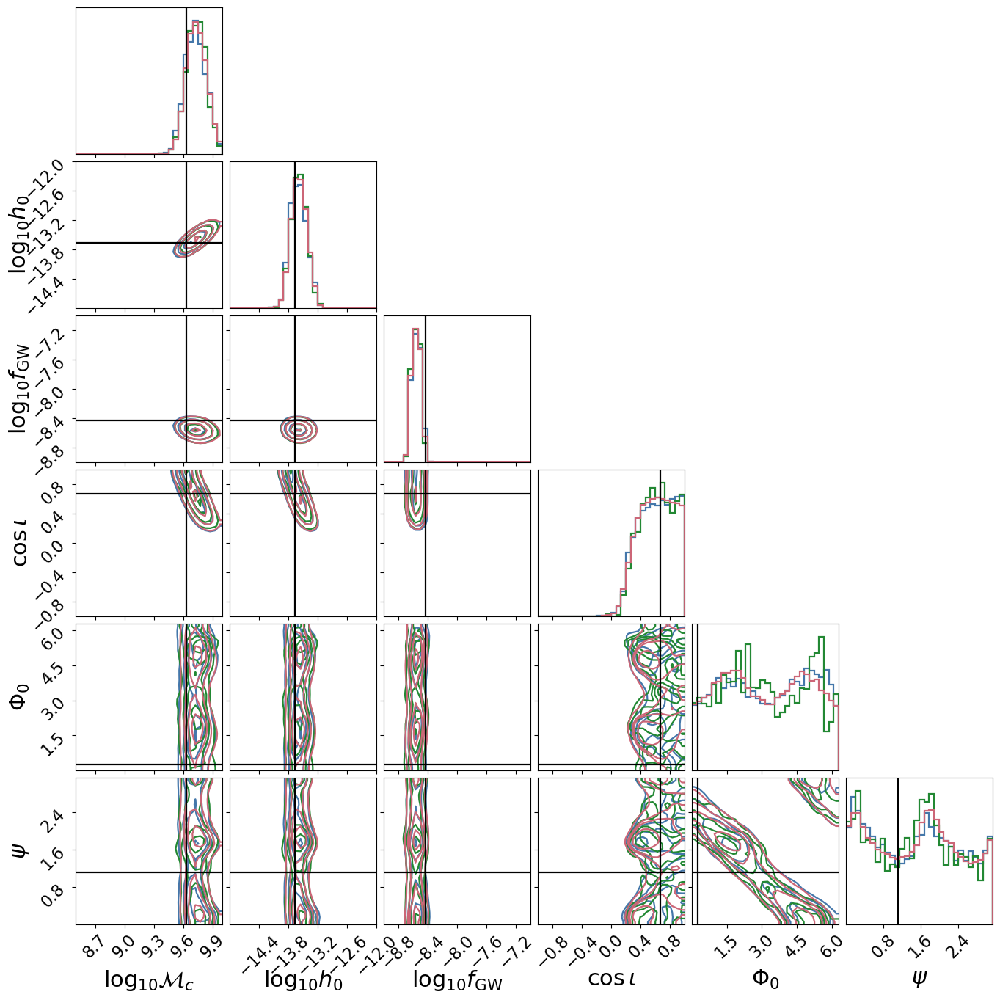

In [7]:
# ===== publication corner, broad, larger labels =====
import corner
import matplotlib.pyplot as plt
plt.rcParams["xtick.labelsize"] = 16
plt.rcParams["ytick.labelsize"] = 16
QCW_arr = np.column_stack([qcw_mc, qcw_h, qcw_fgw, qcw_cosi, qcw_phi, qcw_psi])
ENT_arr = np.column_stack([ent_mc, ent_h, ent_fgw, ent_cosi, ent_phi, ent_psi])
DL_arr  = np.column_stack([loki_mc, loki_h, loki_fgw, loki_cosi, loki_phi, loki_psi])
truths = [np.log10(4.3e9), -13.668773493298787, np.log10(3.7e-9), np.cos(0.8412486994612669), 0.24434609527920614, 1.1187560505283651]
labels = [r"$\log_{10}\mathcal{M}_c$", r"$\log_{10} h_0$", r"$\log_{10} f_{\rm GW}$", r"$\cos\iota$", r"$\Phi_0$", r"$\psi$"]
ranges = [(8.5, 10.0), (-15.0, -12.0), (-9.0, -7.0), (-1, 1), (0, 2*np.pi), (0, np.pi)]
LW = 1.6
sig = np.array([0.5, 1.0, 1.5, 2.0]); levels = 1.0 - np.exp(-0.5*sig**2)
base_kw = dict(labels=labels, bins=30, smooth=1.0, levels=levels, range=ranges,
               plot_datapoints=False, plot_density=False, no_fill_contours=True,
               fill_contours=False, label_kwargs={"fontsize": 22})
C_QCW, C_ENT, C_DL = "#4477AA", "#228833", "#CC6677"
fig = corner.corner(QCW_arr, color=C_QCW, contour_kwargs={"linewidths": LW, "colors": C_QCW}, hist_kwargs={"density": True, "color": C_QCW, "lw": LW}, **base_kw)
corner.corner(ENT_arr, fig=fig, color=C_ENT, contour_kwargs={"linewidths": LW, "colors": C_ENT}, hist_kwargs={"density": True, "color": C_ENT, "lw": LW}, **base_kw)
corner.corner(DL_arr, fig=fig, color=C_DL, contour_kwargs={"linewidths": LW, "colors": C_DL}, hist_kwargs={"density": True, "color": C_DL, "lw": LW}, **base_kw)
corner.overplot_lines(fig, truths, color="k", lw=LW)
fig.savefig("g2d2_broad_truth.png", dpi=300, bbox_inches="tight")
fig.savefig("g2d2_broad_truth.pdf", bbox_inches="tight")
print("saved g2d2_broad_truth")
